In [1]:
import pandas as pd
import sys
import os
import json
import pandas
import numpy
import optparse

from keras.callbacks import TensorBoard
from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Dropout,SimpleRNN
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from collections import OrderedDict
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import mean_squared_error
from tensorflow.keras.layers import Bidirectional
import time

In [2]:
df = pd.read_csv('Tetuan City power consumption.csv')

In [3]:
df.isnull().sum()

DateTime                     0
Temperature                  0
Humidity                     0
Wind Speed                   0
general diffuse flows        0
diffuse flows                0
Zone 1 Power Consumption     0
Zone 2  Power Consumption    0
Zone 3  Power Consumption    0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   DateTime                   52416 non-null  object 
 1   Temperature                52416 non-null  float64
 2   Humidity                   52416 non-null  float64
 3   Wind Speed                 52416 non-null  float64
 4   general diffuse flows      52416 non-null  float64
 5   diffuse flows              52416 non-null  float64
 6   Zone 1 Power Consumption   52416 non-null  float64
 7   Zone 2  Power Consumption  52416 non-null  float64
 8   Zone 3  Power Consumption  52416 non-null  float64
dtypes: float64(8), object(1)
memory usage: 3.6+ MB


In [5]:
df['DateTime'] = pd.to_datetime(df['DateTime'])
df.sort_values(by="DateTime", inplace=True)

In [6]:
df['DateTime']

0       2017-01-01 00:00:00
1       2017-01-01 00:10:00
2       2017-01-01 00:20:00
3       2017-01-01 00:30:00
4       2017-01-01 00:40:00
                ...        
52411   2017-12-30 23:10:00
52412   2017-12-30 23:20:00
52413   2017-12-30 23:30:00
52414   2017-12-30 23:40:00
52415   2017-12-30 23:50:00
Name: DateTime, Length: 52416, dtype: datetime64[ns]

<AxesSubplot:xlabel='DateTime', ylabel='Zone 1 Power Consumption'>

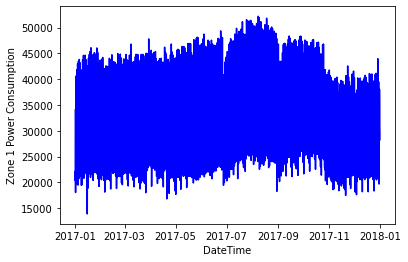

In [7]:
# Plot Zone 1 Power Consumption
sns.lineplot(x='DateTime', y='Zone 1 Power Consumption', color='b', data=df)

<AxesSubplot:xlabel='DateTime', ylabel='Zone 2  Power Consumption'>

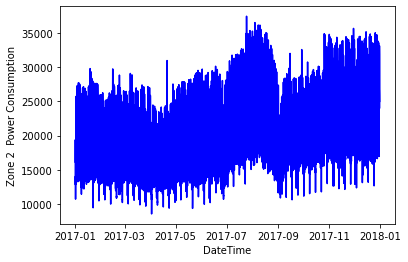

In [8]:
# Plot Zone 2 Power Consumption
sns.lineplot(x='DateTime', y='Zone 2  Power Consumption', color='b', data=df)

<AxesSubplot:xlabel='DateTime', ylabel='Zone 3  Power Consumption'>

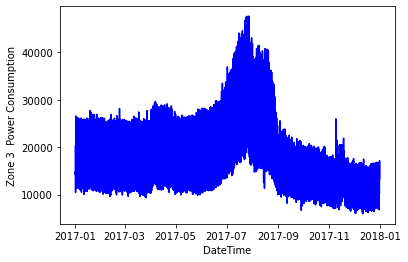

In [9]:
# Plot Zone 2 Power Consumption
sns.lineplot(x='DateTime', y='Zone 3  Power Consumption', color='b', data=df)

In [10]:
import pandas as pd
import numpy as np
from typing import Tuple


def create_data_for_NN(
    data: pd.DataFrame, Y_var: str, lag: int, test_ratio: float
) -> Tuple[np.array, np.array, np.array, np.array]:
    """Function to return lagged time series data after train-test split

    Args:
        data (pd.DataFrame): Raw time series data frame
        Y_var (str): String with the name of y variable
        lag (int): number of lagged records to consider
        test_ratio (float): ratio of data to consider for test set

    Returns:
        Tuple[np.array, np.array, np.array, np.array]: Lagged and split numpy arrays
    """
    y = data[Y_var].tolist()

    X, Y = [], []

    if len(y) - lag <= 0:
        X.append(y)
    else:
        for i in range(len(y) - lag):
            Y.append(y[i + lag])
            X.append(y[i : (i + lag)])

    X, Y = np.array(X), np.array(Y)

    # Reshaping the X array to an LSTM input shape
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))

    # Creating training and test sets
    X_train = X
    X_test = []

    Y_train = Y
    Y_test = []

    if test_ratio > 0:
        index = round(len(X) * test_ratio)
        X_train = X[: (len(X) - index)]
        X_test = X[-index:]

        Y_train = Y[: (len(X) - index)]
        Y_test = Y[-index:]

    return X_train, X_test, Y_train, Y_test

In [11]:
lag = 3
test_ratio = 0.15

X_train, X_test, Y_train, Y_test = create_data_for_NN(
    df, df.columns[6], lag, test_ratio
)

In [12]:
max_value = np.max(df['Zone 1 Power Consumption'])
X_train = X_train / max_value
Y_train = Y_train / max_value
X_test = X_test / max_value
Y_test = Y_test / max_value

In [13]:
start_time1 = time.time()

In [14]:
model1 = Sequential()
model1.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model1.add(Dense(1))
model1.compile(loss='mean_squared_error', optimizer='sgd', metrics=['mape'])
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               40800     
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 40,901
Trainable params: 40,901
Non-trainable params: 0
_________________________________________________________________


In [15]:
model1.fit(X_train, Y_train, batch_size=128, epochs=30, validation_split=0.25)

Epoch 1/30
262/262 [==============================] - 2s 3ms/step - loss: 0.0348 - mape: 21.8242 - val_loss: 0.0107 - val_mape: 14.0941
Epoch 2/30
262/262 [==============================] - 1s 2ms/step - loss: 0.0118 - mape: 15.5422 - val_loss: 0.0094 - val_mape: 13.1845
Epoch 3/30
262/262 [==============================] - 1s 2ms/step - loss: 0.0104 - mape: 14.5578 - val_loss: 0.0083 - val_mape: 12.3499
Epoch 4/30
262/262 [==============================] - 1s 2ms/step - loss: 0.0091 - mape: 13.6198 - val_loss: 0.0073 - val_mape: 11.4977
Epoch 5/30
262/262 [==============================] - 1s 2ms/step - loss: 0.0079 - mape: 12.7166 - val_loss: 0.0063 - val_mape: 10.7956
Epoch 6/30
262/262 [==============================] - 1s 2ms/step - loss: 0.0069 - mape: 11.8656 - val_loss: 0.0055 - val_mape: 10.0177
Epoch 7/30
262/262 [==============================] - 1s 2ms/step - loss: 0.0060 - mape: 11.0456 - val_loss: 0.0048 - val_mape: 9.3461
Epoch 8/30
262/262 [=============================

In [16]:
predict1 = model1.predict(X_test)
predict1 = predict1 * max_value
predict1

array([[25255.693],
       [25742.686],
       [26366.44 ],
       ...,
       [31337.393],
       [30539.262],
       [29852.508]], dtype=float32)

In [17]:
Y_test = Y_test * max_value

In [18]:
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(Y_test, predict1, squared=False)
print("rmse:", rmse)

rmse: 979.066656760478


In [19]:
pd.DataFrame(predict1).to_csv('predict1.csv',header=None, index=None)

In [20]:
pd.DataFrame(Y_test).to_csv('Y_test.csv',header=None, index=None)

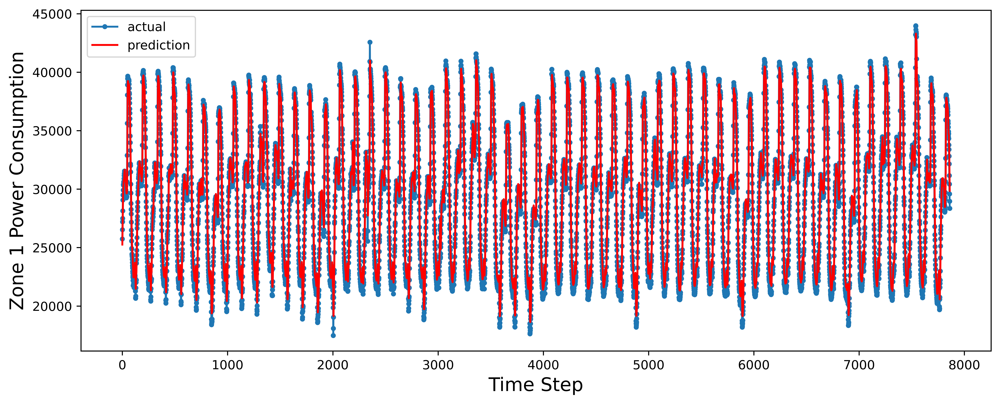

In [23]:
plt.figure(figsize=(13,5), dpi = 800)
plt.plot(Y_test, marker='.', label='actual')
plt.plot(predict1, 'r', label='prediction')
plt.ylabel('Zone 1 Power Consumption', size=15)
plt.xlabel('Time Step', size=15)
plt.legend(fontsize=10)
plt.show()

In [24]:
print("--- %s seconds ---" % (time.time() - start_time1))

--- 22.877627849578857 seconds ---


In [25]:
lag = 12
test_ratio = 0.15

X_train, X_test, Y_train, Y_test = create_data_for_NN(
    df, df.columns[6], lag, test_ratio
)

In [26]:
max_value = np.max(df['Zone 1 Power Consumption'])
X_train = X_train / max_value
Y_train = Y_train / max_value
X_test = X_test / max_value
Y_test = Y_test / max_value

In [27]:
model2 = Sequential()
model2.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model2.add(Dense(1))
model2.compile(loss='mean_squared_error', optimizer='sgd', metrics=[tf.keras.metrics.RootMeanSquaredError()])
model2.fit(X_train, Y_train, batch_size=128, epochs=30, validation_split=0.25)

Epoch 1/30
261/261 [==============================] - 3s 8ms/step - loss: 0.0160 - root_mean_squared_error: 0.1266 - val_loss: 0.0057 - val_root_mean_squared_error: 0.0758
Epoch 2/30
261/261 [==============================] - 2s 6ms/step - loss: 0.0056 - root_mean_squared_error: 0.0750 - val_loss: 0.0041 - val_root_mean_squared_error: 0.0644
Epoch 3/30
261/261 [==============================] - 2s 6ms/step - loss: 0.0041 - root_mean_squared_error: 0.0639 - val_loss: 0.0031 - val_root_mean_squared_error: 0.0556
Epoch 4/30
261/261 [==============================] - 2s 6ms/step - loss: 0.0031 - root_mean_squared_error: 0.0558 - val_loss: 0.0025 - val_root_mean_squared_error: 0.0497
Epoch 5/30
261/261 [==============================] - 2s 6ms/step - loss: 0.0025 - root_mean_squared_error: 0.0503 - val_loss: 0.0021 - val_root_mean_squared_error: 0.0458
Epoch 6/30
261/261 [==============================] - 2s 6ms/step - loss: 0.0022 - root_mean_squared_error: 0.0467 - val_loss: 0.0019 - val_

In [28]:
predict2 = model2.predict(X_test)
predict2 = predict2 * max_value
predict2

array([[24434.99 ],
       [25009.928],
       [25606.404],
       ...,
       [32415.326],
       [31772.943],
       [31135.674]], dtype=float32)

In [29]:
Y_test = Y_test * max_value

In [30]:

rmse2 = mean_squared_error(Y_test, predict2, squared=False)
print("rmse2:", rmse2)

rmse2: 1595.1528837555172


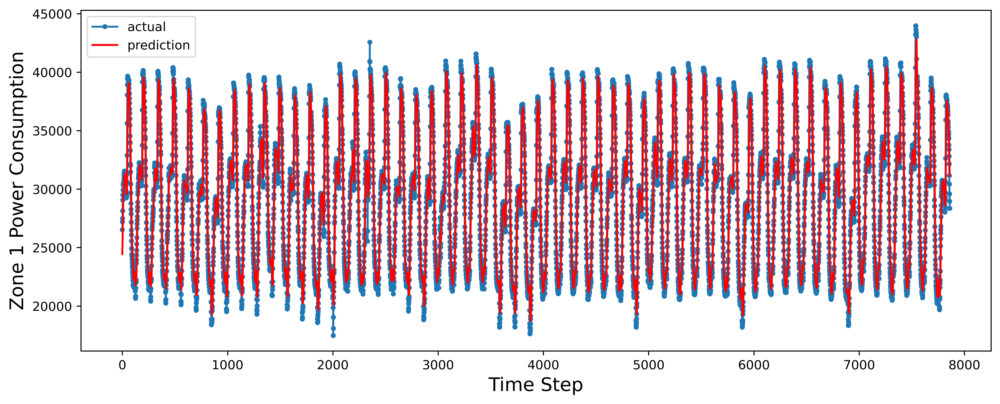

In [31]:
plt.figure(figsize=(13,5), dpi = 800)
plt.plot(Y_test, marker='.', label='actual')
plt.plot(predict2, 'r', label='prediction')
plt.ylabel('Zone 1 Power Consumption', size=15)
plt.xlabel('Time Step', size=15)
plt.legend(fontsize=10)
plt.show()

In [32]:
lag = 24
test_ratio = 0.15

X_train, X_test, Y_train, Y_test = create_data_for_NN(
    df, df.columns[6], lag, test_ratio
)

In [33]:
max_value = np.max(df['Zone 1 Power Consumption'])
X_train = X_train / max_value
Y_train = Y_train / max_value
X_test = X_test / max_value
Y_test = Y_test / max_value

In [34]:
model3 = Sequential()
model3.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model3.add(Dense(1))
model3.compile(loss='mean_squared_error', optimizer='sgd', metrics=[tf.keras.metrics.RootMeanSquaredError()])
model3.fit(X_train, Y_train, batch_size=128, epochs=30, validation_split=0.25)

Epoch 1/30
261/261 [==============================] - 5s 14ms/step - loss: 0.0161 - root_mean_squared_error: 0.1269 - val_loss: 0.0057 - val_root_mean_squared_error: 0.0758
Epoch 2/30
261/261 [==============================] - 3s 13ms/step - loss: 0.0057 - root_mean_squared_error: 0.0754 - val_loss: 0.0043 - val_root_mean_squared_error: 0.0654
Epoch 3/30
261/261 [==============================] - 4s 14ms/step - loss: 0.0043 - root_mean_squared_error: 0.0653 - val_loss: 0.0033 - val_root_mean_squared_error: 0.0576
Epoch 4/30
261/261 [==============================] - 4s 14ms/step - loss: 0.0033 - root_mean_squared_error: 0.0579 - val_loss: 0.0027 - val_root_mean_squared_error: 0.0520
Epoch 5/30
261/261 [==============================] - 4s 15ms/step - loss: 0.0028 - root_mean_squared_error: 0.0527 - val_loss: 0.0023 - val_root_mean_squared_error: 0.0482
Epoch 6/30
261/261 [==============================] - 4s 14ms/step - loss: 0.0024 - root_mean_squared_error: 0.0493 - val_loss: 0.0021 

In [35]:
predict3 = model3.predict(X_test)
predict3 = predict3 * max_value
predict3

array([[25779.979],
       [26303.062],
       [26853.102],
       ...,
       [32232.87 ],
       [31567.457],
       [30909.977]], dtype=float32)

In [36]:
Y_test = Y_test * max_value

In [39]:

rmse3 = mean_squared_error(Y_test, predict3, squared=False)
print("rmse2:", rmse3)

rmse2: 1490.0596409402804


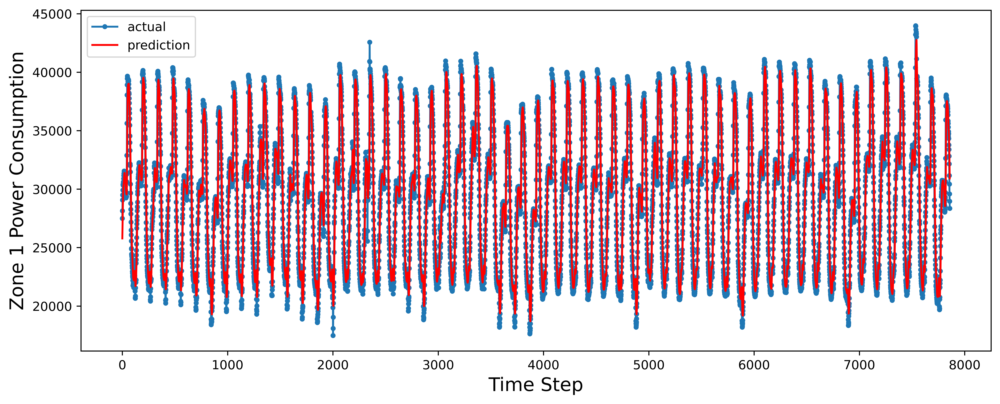

In [38]:
plt.figure(figsize=(13,5), dpi = 800)
plt.plot(Y_test, marker='.', label='actual')
plt.plot(predict3, 'r', label='prediction')
plt.ylabel('Zone 1 Power Consumption', size=15)
plt.xlabel('Time Step', size=15)
plt.legend(fontsize=10)
plt.show()